Census data for DS final project

In [1]:
import plotnine 
import yaml
import requests
import json
import config

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import geopandas as gpd
import plotly.express as px

from us import states
from census import Census
from plotnine import *
from urllib.request import urlopen
from shapely.geometry import Point, Polygon
from pyproj import Transformer

with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)
## print mult things
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
def load_creds_yaml(path: str):
    with open(path, 'r') as stream:
        try:
            creds = yaml.safe_load(stream)
        except yaml.YAMLError as exc:
            print(exc)
    return(creds)

def load_creds_json(path: str):
    with open(path, "r") as file:
        return json.load(file)

def string_to_tuple(string):
    string = string[1:-1]
    return tuple(map(np.float64, string.split(', ')))

try:
    creds = load_creds_yaml("cred.yml")
    c = Census(creds['census_api']['api_key_c'])
except:
    creds = load_creds_json("../config.json")
    c = Census(creds['CENSUS']['API_KEY'])

In [3]:

# List of all variables: https://api.census.gov/data/2019/acs/acs5/variables.html
all_tables = pd.DataFrame(c.acs5.tables())
all_vars = [pd.DataFrame(requests.get(one_table).json()['variables']).T
                for one_table in all_tables.variables]
all_vars_df = pd.concat(all_vars)
all_vars_df['varname'] = all_vars_df.index

In [4]:
relevant_values = all_vars_df.loc[['B01003_001E','B03002_012E','B03002_003E',
                                    'B03002_004E','B03002_005E','B03002_006E','B03002_007E',
                                    'B03002_008E','B03002_009E']]
relevant_values

,label,concept,predicateType,group,limit,predicateOnly,universe,varname
B01003_001E,Estimate!!Total,TOTAL POPULATION,int,B01003,0,True,TOTAL_POP,B01003_001E
B03002_012E,Estimate!!Total:!!Hispanic or Latino:,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,True,TOTAL_POP,B03002_012E
B03002_003E,Estimate!!Total:!!Not Hispanic or Latino:!!Whi...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,True,TOTAL_POP,B03002_003E
B03002_004E,Estimate!!Total:!!Not Hispanic or Latino:!!Bla...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,True,TOTAL_POP,B03002_004E
B03002_005E,Estimate!!Total:!!Not Hispanic or Latino:!!Ame...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,True,TOTAL_POP,B03002_005E
B03002_006E,Estimate!!Total:!!Not Hispanic or Latino:!!Asi...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,True,TOTAL_POP,B03002_006E
B03002_007E,Estimate!!Total:!!Not Hispanic or Latino:!!Nat...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,True,TOTAL_POP,B03002_007E
B03002_008E,Estimate!!Total:!!Not Hispanic or Latino:!!Som...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,True,TOTAL_POP,B03002_008E
B03002_009E,Estimate!!Total:!!Not Hispanic or Latino:!!Two...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,True,TOTAL_POP,B03002_009E


In [5]:
relevant_values['label2'] = ['total_pop','hispanic','white','black',
                             'native_american','asian','pacific_islander','some_other_race','multi_race']
relevant_values

,label,concept,predicateType,group,limit,predicateOnly,universe,varname,label2
B01003_001E,Estimate!!Total,TOTAL POPULATION,int,B01003,0,True,TOTAL_POP,B01003_001E,total_pop
B03002_012E,Estimate!!Total:!!Hispanic or Latino:,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,True,TOTAL_POP,B03002_012E,hispanic
B03002_003E,Estimate!!Total:!!Not Hispanic or Latino:!!Whi...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,True,TOTAL_POP,B03002_003E,white
B03002_004E,Estimate!!Total:!!Not Hispanic or Latino:!!Bla...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,True,TOTAL_POP,B03002_004E,black
B03002_005E,Estimate!!Total:!!Not Hispanic or Latino:!!Ame...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,True,TOTAL_POP,B03002_005E,native_american
B03002_006E,Estimate!!Total:!!Not Hispanic or Latino:!!Asi...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,True,TOTAL_POP,B03002_006E,asian
B03002_007E,Estimate!!Total:!!Not Hispanic or Latino:!!Nat...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,True,TOTAL_POP,B03002_007E,pacific_islander
B03002_008E,Estimate!!Total:!!Not Hispanic or Latino:!!Som...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,True,TOTAL_POP,B03002_008E,some_other_race
B03002_009E,Estimate!!Total:!!Not Hispanic or Latino:!!Two...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,True,TOTAL_POP,B03002_009E,multi_race


In [6]:
#Try calculation and visualization for 1 state
#Hisp pop numbers
va_census2 = c.acs5.state_county_tract(fields = ('NAME','B01003_001E','B03002_001E','B03002_012E','B03002_003E',
                                                'B03002_004E','B03002_005E','B03002_006E','B03002_007E',
                                               'B03002_008E','B03002_009E'
                                             
                                                ),
                                      state_fips = states.VA.fips,
                                      county_fips = "*",
                                      tract = "*",
                                      year = 2019)

In [7]:
va_df = pd.DataFrame(va_census2)

# Show the dataframe
va_df.head(2)
print('Shape: ', va_df.shape)

,NAME,B01003_001E,B03002_001E,B03002_012E,B03002_003E,B03002_004E,B03002_005E,B03002_006E,B03002_007E,B03002_008E,B03002_009E,state,county,tract
0,"Census Tract 202, Fluvanna County, Virginia",4863.0,4863.0,389.0,3281.0,1147.0,21.0,0.0,0.0,0.0,25.0,51,065,020200
1,"Census Tract 4607.02, Fairfax County, Virginia",4578.0,4578.0,168.0,3234.0,99.0,0.0,830.0,0.0,9.0,238.0,51,059,460702


Shape:  (1907, 14)


In [8]:
# Access shapefile of Virginia census tracts
va_tract = gpd.read_file("https://www2.census.gov/geo/tiger/TIGER2019/TRACT/tl_2019_51_tract.zip")

# Reproject shapefile to UTM Zone 17N
# https://spatialreference.org/ref/epsg/wgs-84-utm-zone-17n/
va_tract = va_tract.to_crs(epsg = 4326)


In [9]:
va_df["GEOID"] = va_df["state"] + va_df["county"] + va_df["tract"]
va_merge = va_tract.merge(va_df, on = "GEOID")
va_merge.head(2)
va_merge.shape

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,B03002_003E,B03002_004E,B03002_005E,B03002_006E,B03002_007E,B03002_008E,B03002_009E,state,county,tract
0,51,700,032132,51700032132,321.32,Census Tract 321.32,G5020,S,2552457,0,...,2521.0,1369.0,0.0,223.0,0.0,0.0,541.0,51,700,032132
1,51,700,032226,51700032226,322.26,Census Tract 322.26,G5020,S,3478916,165945,...,1065.0,1917.0,0.0,339.0,16.0,52.0,191.0,51,700,032226


(1907, 27)

In [10]:
#Create a new column that calculates the non-white and non-hispanic % of the population:
va_merge['non_white_percentage'] = 1 - (va_merge.B03002_003E / va_merge.B01003_001E)
#subset original table to the relevant fields for visualization
va_non_white_perc_tract = va_merge[["STATEFP", "COUNTYFP", "TRACTCE", "GEOID", "geometry",'non_white_percentage']]

In [11]:
type(va_non_white_perc_tract)

geopandas.geodataframe.GeoDataFrame

In [12]:
va_non_white_perc_county = va_non_white_perc_tract.dissolve(by = 'COUNTYFP', aggfunc = 'sum')
va_non_white_perc_county.head()

,geometry,non_white_percentage
COUNTYFP,,
001,"POLYGON ((-75.66645 37.46762, -75.66814 37.467...",2.950410
003,"POLYGON ((-78.46779 37.82338, -78.46848 37.822...",5.236236
005,"POLYGON ((-79.88692 37.89291, -79.88658 37.892...",0.447590
007,"POLYGON ((-77.85180 37.35486, -77.85178 37.354...",0.525173
009,"POLYGON ((-79.08856 37.39667, -79.08862 37.396...",2.376963


<AxesSubplot:>

Text(0.5, 1.0, 'Non-white population (%) in Virginia')

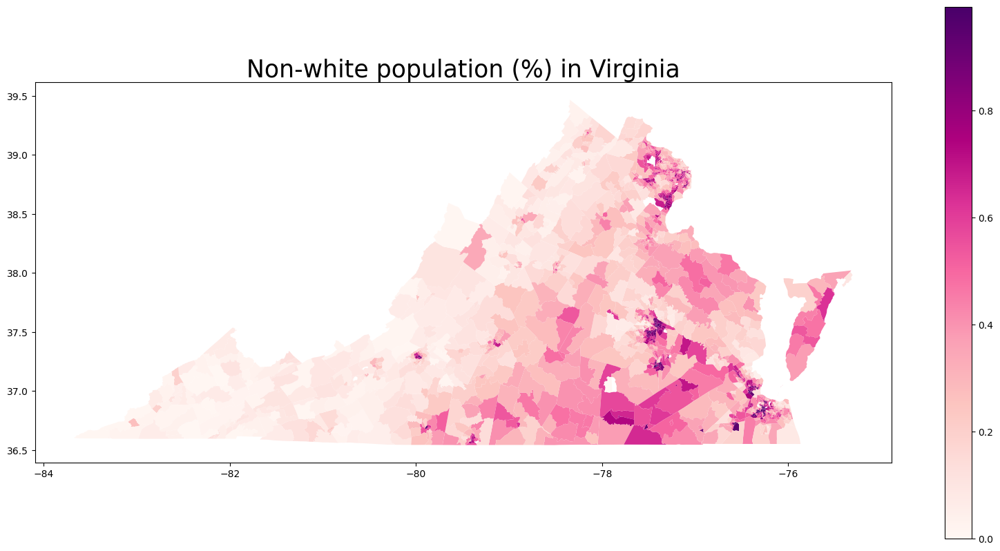

In [13]:
# Create subplots
fig, ax = plt.subplots(1, 1, figsize = (20, 10))

# Plot data
va_non_white_perc_tract.plot(column = "non_white_percentage",
                       ax = ax,
                       cmap = "RdPu",
                       legend = True)

# Stylize plots
plt.style.use('bmh')

# Set title
ax.set_title('Non-white population (%) in Virginia', fontdict = {'fontsize': '25', 'fontweight' : '3'})

In [14]:
va_merge_checks = va_merge.dissolve(by = 'STATEFP', aggfunc = 'sum')
va_merge_checks

,geometry,ALAND,AWATER,B01003_001E,B03002_001E,B03002_012E,B03002_003E,B03002_004E,B03002_005E,B03002_006E,B03002_007E,B03002_008E,B03002_009E,non_white_percentage
STATEFP,,,,,,,,,,,,,,
51,"POLYGON ((-82.14976 36.59475, -82.14985 36.594...",102258306285,8527942672,8454463.0,8454463.0,792001.0,5227569.0,1588726.0,18092.0,536076.0,5146.0,21750.0,265103.0,713.782063


In [15]:
#Doble check if columns add up, no doble count and no missing values
va_merge_checks.B03002_012E + va_merge_checks.B03002_003E+va_merge_checks.B03002_004E+va_merge_checks.B03002_005E\
+va_merge_checks.B03002_006E+va_merge_checks.B03002_007E+va_merge_checks.B03002_008E+va_merge_checks.B03002_009E

STATEFP
51    8454463.0
dtype: float64

In [16]:
#Entire US data pull - US ACS, 2019, tract level, total pop & racial splits

cols_pull = tuple(relevant_values.varname)
all_states = states.STATES
json_census = [c.acs5.state_county_tract(cols_pull, state.fips, county_fips = "*", tract = "*", year=2019) for state in states.STATES]
json_all_census = [pd.DataFrame(json) for json in json_census]
census = pd.concat(json_all_census)

In [17]:
census.head()
census.shape

,B01003_001E,B03002_012E,B03002_003E,B03002_004E,B03002_005E,B03002_006E,B03002_007E,B03002_008E,B03002_009E,state,county,tract
0,4781.0,17.0,77.0,4629.0,58.0,0.0,0.0,0.0,0.0,01,073,001100
1,1946.0,133.0,0.0,1784.0,0.0,0.0,0.0,22.0,7.0,01,073,001400
2,4080.0,306.0,1132.0,2604.0,0.0,0.0,0.0,0.0,38.0,01,073,002000
3,5291.0,0.0,85.0,5161.0,0.0,0.0,0.0,0.0,45.0,01,073,003802
4,2533.0,173.0,167.0,2171.0,22.0,0.0,0.0,0.0,0.0,01,073,004000


(72877, 12)

In [18]:
d0 = relevant_values['label2']
d = d0.to_dict()
d.update({'state':'state','county':'county','tract':'tract'})
census = census.rename(columns=d)
census.head()

,total_pop,hispanic,white,black,native_american,asian,pacific_islander,some_other_race,multi_race,state,county,tract
0,4781.0,17.0,77.0,4629.0,58.0,0.0,0.0,0.0,0.0,01,073,001100
1,1946.0,133.0,0.0,1784.0,0.0,0.0,0.0,22.0,7.0,01,073,001400
2,4080.0,306.0,1132.0,2604.0,0.0,0.0,0.0,0.0,38.0,01,073,002000
3,5291.0,0.0,85.0,5161.0,0.0,0.0,0.0,0.0,45.0,01,073,003802
4,2533.0,173.0,167.0,2171.0,22.0,0.0,0.0,0.0,0.0,01,073,004000


In [19]:
#List of tract files: https://www2.census.gov/geo/tiger/TIGER2019/TRACT/
tract_list = [item for item in range(1, 57)]
tract_list[0:10]=['01','02','03','04','05','06','07','08','09']
tract_list = [str(i) for i in tract_list]
tract_list = [e for e in tract_list if e not in ('01','03','07','14','43','52')]
all_tract_map = pd.DataFrame(columns=[va_tract.columns.values])

In [20]:
# Create one shapefile of all US census tracts
    
q = 'https://www2.census.gov/geo/tiger/TIGER2019/TRACT/tl_2019_01_tract.zip'
tract_q_base = gpd.read_file(q)  
    
for i in tract_list:
    q = 'https://www2.census.gov/geo/tiger/TIGER2019/TRACT/tl_2019_'+str(i)+'_tract.zip'
    tract_q = gpd.read_file(q).reset_index()
    
    tract_q_base = pd.concat([tract_q_base,tract_q])

tract_q_base

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,index
0,01,055,010700,01055010700,107,Census Tract 107,G5020,S,87404337,2927199,+34.0726595,-085.8991944,"POLYGON ((-85.98699 34.04413, -85.98606 34.045...",NaN
1,01,055,001300,01055001300,13,Census Tract 13,G5020,S,5083957,836213,+34.0078782,-085.9865947,"POLYGON ((-86.00068 34.00537, -86.00023 34.006...",NaN
2,01,055,000900,01055000900,9,Census Tract 9,G5020,S,11932347,740907,+34.0003469,-086.0427603,"POLYGON ((-86.07079 34.00011, -86.07076 34.000...",NaN
3,01,055,001700,01055001700,17,Census Tract 17,G5020,S,9118882,0,+33.9825311,-085.9518384,"POLYGON ((-85.96885 33.98825, -85.96884 33.988...",NaN
4,01,055,010501,01055010501,105.01,Census Tract 105.01,G5020,S,50209675,7198559,+33.8992688,-086.0295803,"POLYGON ((-86.07352 33.90549, -86.07337 33.906...",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,56,033,000200,56033000200,2,Census Tract 2,G5020,S,3510226,0,+44.7895266,-106.9649830,"POLYGON ((-106.97995 44.78784, -106.97990 44.7...",127.0
128,56,031,959400,56031959400,9594,Census Tract 9594,G5020,S,3104783174,10390675,+41.9289629,-104.9795974,"POLYGON ((-105.28145 42.12274, -105.28144 42.1...",128.0
129,56,031,959100,56031959100,9591,Census Tract 9591,G5020,S,2286143459,65738338,+42.4007990,-104.9480644,"POLYGON ((-105.28651 42.60583, -105.28608 42.6...",129.0
130,56,021,000800,56021000800,8,Census Tract 8,G5020,S,1275870,0,+41.1492936,-104.7986792,"POLYGON ((-104.80930 41.14624, -104.80926 41.1...",130.0


In [21]:
# Reproject shapefile to UTM Zone 17N
# https://spatialreference.org/ref/epsg/wgs-84-utm-zone-17n/
us_tract = tract_q_base.to_crs(epsg = 4326)

In [22]:
type(us_tract)

geopandas.geodataframe.GeoDataFrame

In [23]:
# Create the non-white and white pop % columns
census['white_percentage']=census.white / census.total_pop
census['non_white_percentage']= 1-(census.white / census.total_pop)
census['countyfips'] = census.state+census.county
census['GEOID'] = census.state+census.county+census.tract

#Subset
census_analysis = census[['state','county','tract','countyfips','GEOID','white_percentage','non_white_percentage']]
census_analysis_county = census[['state','county','tract','countyfips','GEOID','white','total_pop']]


# Visualization I: % of non-white population in the US on the county level

#Ia: map

census_county = census_analysis_county.groupby('countyfips').sum().reset_index()
census_analysis.head(1)
census_county['white_percentage']=census_county.white / census_county.total_pop
census_county['non_white_percentage']= 1-(census_county.white / census_county.total_pop)
census_county.head(2)
fig_us_county_pop = px.choropleth(census_county, geojson=counties, locations='countyfips', color='non_white_percentage',
                           color_continuous_scale="Viridis",
                           range_color=(0, 1),
                           scope="usa",
                           labels={'non_white_percentage':'% of non-white population'}
                          )
fig_us_county_pop.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
#fig_us_county_pop.show()


,state,county,tract,countyfips,GEOID,white_percentage,non_white_percentage
0,01,073,001100,01073,01073001100,0.016105,0.983895


,countyfips,white,total_pop,white_percentage,non_white_percentage
0,01001,41315.0,55380.0,0.746027,0.253973
1,01003,176803.0,212830.0,0.830724,0.169276


In [24]:
#Visualization II: % of non-white population in the US on the tract level
state_fips_data = pd.read_csv("../input/state_fips.csv")
us_merge = pd.merge(us_tract, census, on = "GEOID")
us_merge["STATEFP"] = us_merge.STATEFP.astype(np.int64)
us_merge = us_merge.merge(state_fips_data, left_on = "STATEFP", right_on="STATE")
us_merge = us_merge[~us_merge["STUSAB"].isin(["MP", "PR", "GU", "AS", "AK", "VI", "HI"])]
#us_merge = us_merge.drop(["STATE", "STUSAB", "STATE_NAME", "STATENS"], axis=1)
us_merge.head(2)
us_merge.shape
type(us_merge)

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,state,county,tract,white_percentage,non_white_percentage,countyfips,STATE,STUSAB,STATE_NAME,STATENS
0,1,055,010700,01055010700,107,Census Tract 107,G5020,S,87404337,2927199,...,01,055,010700,0.832321,0.167679,01055,1,AL,Alabama,1779775
1,1,055,001300,01055001300,13,Census Tract 13,G5020,S,5083957,836213,...,01,055,001300,0.381278,0.618722,01055,1,AL,Alabama,1779775


(72141, 33)

geopandas.geodataframe.GeoDataFrame

<AxesSubplot:>

Text(0.5, 1.0, 'Non-white population (%) in the United States')

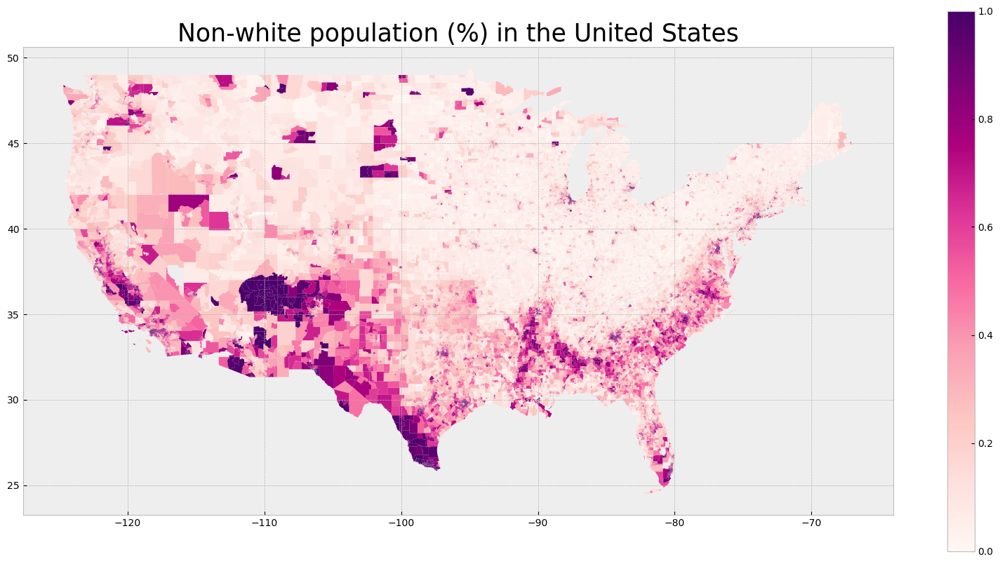

In [25]:
# Create subplots
fig, ax = plt.subplots(1, 1, figsize = (20, 10))

# Plot data
us_merge.plot(column = "non_white_percentage",
                       ax = ax,
                       cmap = "RdPu",
                       legend = True)

# Stylize plots
plt.style.use('bmh')

# Set title
ax.set_title('Non-white population (%) in the United States', fontdict = {'fontsize': '25', 'fontweight' : '3'})

# Once asthma data is in:
- Split map into 2 - based on +/-50% white
- How proximity is correlated with tract composition:  x axis is the proximity to toxic release, the y axis is % non-white, size is total pollution
- How proximity is correlated with asthma: same but asthma on y axis
- How racial/ethnic composition is correlated with asthma

,GEOID,geometry,non_white_percentage
67269,51700032132,"POLYGON ((-76.52913 37.14114, -76.52911 37.141...",0.495497
67270,51700032226,"POLYGON ((-76.56883 37.17481, -76.56796 37.175...",0.762806
67271,51087200600,"POLYGON ((-77.48872 37.61820, -77.48861 37.618...",0.338406
67272,51087200700,"POLYGON ((-77.47378 37.61668, -77.47341 37.616...",0.361645
67273,51143011001,"POLYGON ((-79.68944 36.64990, -79.68941 36.650...",0.160820
...,...,...,...
69171,51165010800,"POLYGON ((-78.82844 38.58124, -78.82838 38.581...",0.110545
69172,51165010700,"POLYGON ((-78.95024 38.56288, -78.95023 38.562...",0.015893
69173,51165010400,"POLYGON ((-78.80434 38.53328, -78.80399 38.533...",0.059041
69174,51165011500,"POLYGON ((-78.99032 38.38567, -78.99016 38.386...",0.098090


<AxesSubplot:>

Text(0.5, 1.0, 'Non-white population (%) in VA, tracts')

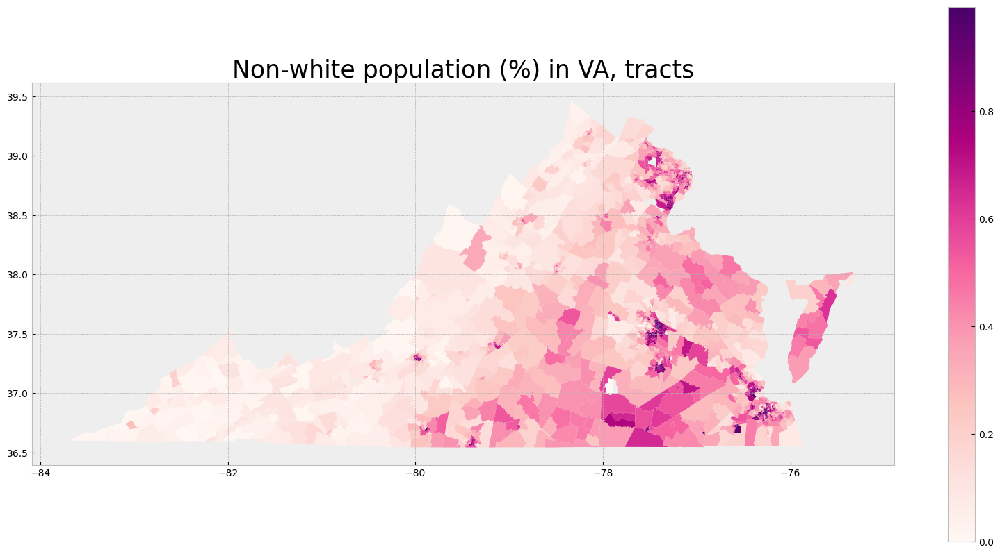

In [27]:
us_merge_VA = us_merge[us_merge.state=='51']
us_merge_VA_viz = us_merge_VA[['GEOID','geometry','non_white_percentage']]
#us_merge_VA_viz = us_merge_VA.dissolve(by = 'COUNTYFP', aggfunc = 'sum')
us_merge_VA_viz
# Create subplots
fig, ax = plt.subplots(1, 1, figsize = (20, 10))

# Plot data
us_merge_VA_viz.plot(column = "non_white_percentage",
                       ax = ax,
                       cmap = "RdPu",
                       legend = True)

# Stylize plots
plt.style.use('bmh')

# Set title
ax.set_title('Non-white population (%) in VA, tracts', fontdict = {'fontsize': '25', 'fontweight' : '3'})

In [28]:
us_merge_VA_viz.info()


<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 1907 entries, 67269 to 69175
Data columns (total 3 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   GEOID                 1907 non-null   object  
 1   geometry              1907 non-null   geometry
 2   non_white_percentage  1879 non-null   float64 
dtypes: float64(1), geometry(1), object(1)
memory usage: 59.6+ KB


<AxesSubplot:>

Text(0.5, 1.0, 'Non-white population (%) in VA, counties')

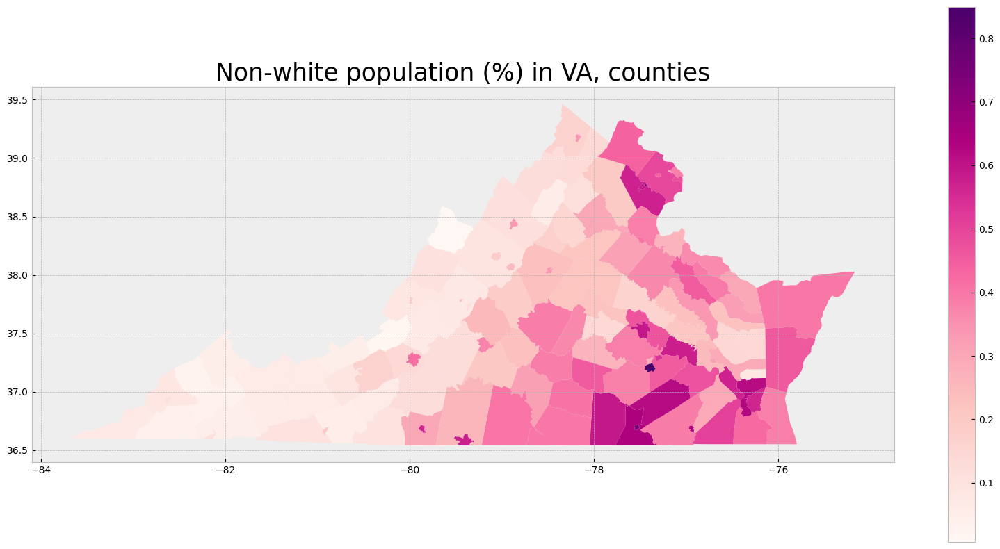

In [29]:
us_merge_VA_viz2 = us_merge_VA.dissolve(by = 'COUNTYFP', aggfunc = 'sum')
us_merge_VA_viz2['white_percentage']=us_merge_VA_viz2['white'] / us_merge_VA_viz2['total_pop']
us_merge_VA_viz2['non_white_percentage']= 1-(us_merge_VA_viz2['white'] / us_merge_VA_viz2['total_pop'])
us_merge_VA_viz_county = us_merge_VA_viz2[['geometry','non_white_percentage']]

# Create subplots
fig, ax = plt.subplots(1, 1, figsize = (20, 10))

# Plot data
us_merge_VA_viz_county.plot(column = "non_white_percentage",
                       ax = ax,
                       cmap = "RdPu",
                       legend = True)

# Stylize plots
plt.style.use('bmh')

# Set title
ax.set_title('Non-white population (%) in VA, counties', fontdict = {'fontsize': '25', 'fontweight' : '3'})



In [30]:
# places = []
# offset = 0
# while(1):
#     params = {
#         "$limit": 50000,
#         "$offset": offset
#     }
#     try:
#         tmp = requests.get("https://chronicdata.cdc.gov/resource/373s-ayzu.json", params = params).json()
#         if(tmp == []):
#             break
#         places = places + tmp
#         offset = offset + 50000
#     except:
#         break

In [32]:
# cdc_places_2019 = pd.concat([pd.DataFrame(places[j], index=[j]) for j in range(len(places))])
# cdc_places_2019["geolocation"] = cdc_places_2019["geolocation"].apply(lambda x: (string_to_tuple(x)[1], string_to_tuple(x)[0]))
# cdc_places_2019["geolocation"] = [(round(lon, 5), round(lat, 5)) for lon, lat in cdc_places_2019["geolocation"]]

In [33]:
cdc = pd.read_csv('../input/PLACES__Local_Data_for_Better_Health__Census_Tract_Data_2021_release.csv')

In [34]:
cdc.head(2)
cdc.shape

,Year,StateAbbr,StateDesc,CountyName,CountyFIPS,LocationName,DataSource,Category,Measure,Data_Value_Unit,...,Data_Value_Footnote,Low_Confidence_Limit,High_Confidence_Limit,TotalPopulation,Geolocation,LocationID,CategoryID,MeasureId,DataValueTypeID,Short_Question_Text
0,2018,AL,Alabama,Baldwin,1003,1003011601,BRFSS,Prevention,Cervical cancer screening among adult women ag...,%,...,NaN,83.5,87.1,6062,POINT (-87.55879555 30.41466842),1003011601,PREVENT,CERVICAL,CrdPrv,Cervical Cancer Screening
1,2019,ME,Maine,Waldo,23027,23027045000,BRFSS,Health Status,Fair or poor self-rated health status among ad...,%,...,NaN,17.4,20.3,5969,POINT (-69.23270168 44.42005508),23027045000,HLTHSTAT,GHLTH,CrdPrv,General Health


(2125561, 23)

In [35]:
#Filter to one year and asthma only
cdc_analysis_1 = cdc[(cdc.Year==2019) & (cdc.Short_Question_Text=='Current Asthma')].copy()

#subset to relevant columns
cdc_analysis = cdc_analysis_1[['StateAbbr','CountyName','CountyFIPS',
                                            'LocationName','Measure','Data_Value',
                                             'Data_Value_Unit','TotalPopulation',
                                             'Geolocation','LocationID']].copy()
#Calculate absolute value of population with asthma
cdc_analysis['value_numeric'] = cdc_analysis.Data_Value.astype(float) *\
                                cdc_analysis.TotalPopulation.astype(float) *0.01
#cdc_analysis.head(2)
cdc_analysis.shape
cdc_analysis.head(1)

(70338, 11)

,StateAbbr,CountyName,CountyFIPS,LocationName,Measure,Data_Value,Data_Value_Unit,TotalPopulation,Geolocation,LocationID,value_numeric
28,AL,DeKalb,1049,1049960100,Current asthma among adults aged >=18 years,10.1,%,5937,POINT (-85.63653943 34.72941568),1049960100,599.637


In [36]:
us_merge[us_merge.GEOID=='01049960100']
us_merge.head()
len('01049960100')

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,state,county,tract,white_percentage,non_white_percentage,countyfips,STATE,STUSAB,STATE_NAME,STATENS
565,1,049,960100,01049960100,9601,Census Tract 9601,G5020,S,202886501,0,...,01,049,960100,0.920435,0.079565,01049,1,AL,Alabama,1779775


,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,state,county,tract,white_percentage,non_white_percentage,countyfips,STATE,STUSAB,STATE_NAME,STATENS
0,1,055,010700,01055010700,107,Census Tract 107,G5020,S,87404337,2927199,...,01,055,010700,0.832321,0.167679,01055,1,AL,Alabama,1779775
1,1,055,001300,01055001300,13,Census Tract 13,G5020,S,5083957,836213,...,01,055,001300,0.381278,0.618722,01055,1,AL,Alabama,1779775
2,1,055,000900,01055000900,9,Census Tract 9,G5020,S,11932347,740907,...,01,055,000900,0.755987,0.244013,01055,1,AL,Alabama,1779775
3,1,055,001700,01055001700,17,Census Tract 17,G5020,S,9118882,0,...,01,055,001700,0.426278,0.573722,01055,1,AL,Alabama,1779775
4,1,055,010501,01055010501,105.01,Census Tract 105.01,G5020,S,50209675,7198559,...,01,055,010501,0.955952,0.044048,01055,1,AL,Alabama,1779775


11

In [37]:
len('01049960100')
cdc_analysis['LocationID'] = cdc_analysis.LocationID.astype(str)
cdc_analysis['GEOID'] = cdc_analysis.LocationID.str.pad(width = 11,
                                                     side = "left",
                                                     fillchar = "0")
cdc_analysis.head(1)

11

,StateAbbr,CountyName,CountyFIPS,LocationName,Measure,Data_Value,Data_Value_Unit,TotalPopulation,Geolocation,LocationID,value_numeric,GEOID
28,AL,DeKalb,1049,1049960100,Current asthma among adults aged >=18 years,10.1,%,5937,POINT (-85.63653943 34.72941568),1049960100,599.637,01049960100


In [38]:
#Merge the US census data with the CDC data
cdc_analysis_merge = cdc_analysis[['Data_Value','GEOID','value_numeric']].copy()

us_cdc_census = pd.merge(us_merge,cdc_analysis_merge, on = "GEOID")
us_cdc_census.head(1)
type(us_cdc_census)
us_cdc_census.shape

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,tract,white_percentage,non_white_percentage,countyfips,STATE,STUSAB,STATE_NAME,STATENS,Data_Value,value_numeric
0,1,055,010700,01055010700,107,Census Tract 107,G5020,S,87404337,2927199,...,010700,0.832321,0.167679,01055,1,AL,Alabama,1779775,9.7,365.593


geopandas.geodataframe.GeoDataFrame

(69462, 35)

In [39]:
us_merge[us_merge["STATEFP"] == 51]

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,state,county,tract,white_percentage,non_white_percentage,countyfips,STATE,STUSAB,STATE_NAME,STATENS
67269,51,700,032132,51700032132,321.32,Census Tract 321.32,G5020,S,2552457,0,...,51,700,032132,0.504503,0.495497,51700,51,VA,Virginia,1779803
67270,51,700,032226,51700032226,322.26,Census Tract 322.26,G5020,S,3478916,165945,...,51,700,032226,0.237194,0.762806,51700,51,VA,Virginia,1779803
67271,51,087,200600,51087200600,2006,Census Tract 2006,G5020,S,2440454,3537,...,51,087,200600,0.661594,0.338406,51087,51,VA,Virginia,1779803
67272,51,087,200700,51087200700,2007,Census Tract 2007,G5020,S,3004440,61338,...,51,087,200700,0.638355,0.361645,51087,51,VA,Virginia,1779803
67273,51,143,011001,51143011001,110.01,Census Tract 110.01,G5020,S,127726451,167026,...,51,143,011001,0.839180,0.160820,51143,51,VA,Virginia,1779803
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69171,51,165,010800,51165010800,108,Census Tract 108,G5020,S,60388605,323261,...,51,165,010800,0.889455,0.110545,51165,51,VA,Virginia,1779803
69172,51,165,010700,51165010700,107,Census Tract 107,G5020,S,81990252,257288,...,51,165,010700,0.984107,0.015893,51165,51,VA,Virginia,1779803
69173,51,165,010400,51165010400,104,Census Tract 104,G5020,S,110603677,434809,...,51,165,010400,0.940959,0.059041,51165,51,VA,Virginia,1779803
69174,51,165,011500,51165011500,115,Census Tract 115,G5020,S,10292725,225318,...,51,165,011500,0.901910,0.098090,51165,51,VA,Virginia,1779803


In [40]:
us_cdc_census = us_cdc_census.rename(columns = {'Data_Value':'asthma_percentage', 'value_numeric':'asthma_cases'})

In [ ]:
us_cdc_census_viz = us_cdc_census[['STATEFP','COUNTYFP','TRACTCE','geometry','total_pop','white','asthma_cases']]

va_cdc_census_viz = us_cdc_census_viz[us_cdc_census_viz.STATEFP==51]

va_cdc_census_viz_county = va_cdc_census_viz.dissolve(by = 'COUNTYFP', aggfunc = 'sum')
va_cdc_census_viz_county['white_percentage']=va_cdc_census_viz_county['white'] / va_cdc_census_viz_county['total_pop']
va_cdc_census_viz_county['non_white_percentage']= 1-(va_cdc_census_viz_county['white'] / va_cdc_census_viz_county['total_pop'])
va_cdc_census_viz_county['asthma_percentage']=va_cdc_census_viz_county['asthma_cases'] / va_cdc_census_viz_county['total_pop']
#va_cdc_census_viz_county.head()


In [ ]:
#For Virginia (code can be reused with different state)

conditions_nw = [
    (va_cdc_census_viz_county['white_percentage'] >= 0.7),
    (va_cdc_census_viz_county['white_percentage'] < 0.7),
    ]

values_nw = [va_cdc_census_viz_county.asthma_percentage, 0]
values_w = [0, va_cdc_census_viz_county.asthma_percentage]

va_cdc_census_viz_county['asthma_non_white'] = np.select(conditions_nw, values_w)
va_cdc_census_viz_county['asthma_white'] = np.select(conditions_nw, values_nw)

va_cdc_census_viz_county.head(1)

In [ ]:
va_cdc_census_viz_county.asthma_percentage.max()

In [ ]:
tri_2019 = pd.read_csv("../input/tri_2019_us.csv")
tri_2019_subset = tri_2019[~tri_2019["8. ST"].isin(["MP", "PR", "GU", "AS", "VI", "AK", "HI"])]
tri_2019_subset = tri_2019_subset[(tri_2019_subset['48. 5.2 - STACK AIR'] > 0) | tri_2019_subset["47. 5.1 - FUGITIVE AIR"] > 0]

tri_2019_subset = tri_2019_subset[(tri_2019_subset['48. 5.2 - STACK AIR'] > tri_2019_subset['48. 5.2 - STACK AIR'].quantile(0.90)) | (tri_2019_subset["47. 5.1 - FUGITIVE AIR"] > tri_2019_subset['47. 5.1 - FUGITIVE AIR'].quantile(0.90))]
tri_2019_subset["geocoded"] = [(tri_2019_subset.iloc[a]['13. LONGITUDE'], tri_2019_subset.iloc[a]['12. LATITUDE']) 
                      for a in range(len(tri_2019_subset))]

In [ ]:
va_tri_data = tri_2019_subset[tri_2019_subset["8. ST"] == "VA"]

In [ ]:
va_tri_data

In [ ]:
type(va_cdc_census_viz_county)

In [ ]:

# Create subplots
fig, ax = plt.subplots(1, 1, figsize = (20, 10))

# Plot data
va_cdc_census_viz_county.plot(column = "asthma_white",
                       ax = ax,
                       cmap = "Blues",
                       norm=plt.Normalize(vmin=0, vmax=0.14),
                        label = "Asthma rates (white)",
                       legend = True)

va_cdc_census_viz_county.plot(column = "asthma_non_white",
                       ax = ax,
                       cmap = "Greens",
                       alpha = 0.5,
                       norm=plt.Normalize(vmin=0, vmax=0.14),
                              label = "Asthma rates (non-white)",
                        legend = True)

geom = [Point(x) for x in va_tri_data.geocoded]
geo_df = gpd.GeoDataFrame(va_tri_data, 
                          crs = {'init':'EPSG:4326'}, 
                          geometry = geom)


_tmp = plt.xticks(rotation=90)
markersize = (geo_df["48. 5.2 - STACK AIR"] + geo_df["47. 5.1 - FUGITIVE AIR"]) / 200
geo_df["geometry"].plot(ax=ax, edgecolor="Red", markersize=markersize, facecolor="None")


# Stylize plots
plt.style.use('bmh')

# Set title
ax.set_title('Asthma cases grouped by race', fontdict = {'fontsize': '25', 'fontweight' : '3'})



In [ ]:

# Create subplots
fig, ax = plt.subplots(1, 1, figsize = (20, 10))

# Plot data
va_cdc_census_viz_county.plot(column = "asthma_non_white",
                       ax = ax,
                       cmap = "Blues",
                       norm=plt.Normalize(vmin=0, vmax=0.14),
                       legend = True)

# Stylize plots
plt.style.use('bmh')

# Set title
ax.set_title('Asthma cases where population is less than 70% white', fontdict = {'fontsize': '25', 'fontweight' : '3'})



In [ ]:
#To pull county shapes if needed separately:
#https://www2.census.gov/geo/tiger/TIGER2019/COUNTY/tl_2019_us_county.zip